#Importar librerías y Drive

In [3]:
from sklearn.cluster import KMeans
import cv2
import os
import numpy as np
from google.colab import drive
from google.colab.patches import cv2_imshow
drive.mount('/content/drive', force_remount=True)


Mounted at /content/drive


#Acceso a las imágenes:

Las imágenes se pueden descargar de: https://github.com/rubenchov/aprendizajeautomaticovision/tree/main/Conjuntos%20de%20datos/Satelitales

Se deben pegar en una carpeta de Drive de la misma cuenta en la que se usa Google Colab, actualizar a continuación la ruta base y nombre del archivo de imagen (tiff)

In [5]:
path = '/content/drive/MyDrive/2026/Docencia/Visión con IA/2. Aprendizaje Automático/Imágenes Satelitales' #Actualizar ruta dependiendo de dónde descargue las imágenes
img_name = '2017.tif' #Actualizar también el nombre de la imagen dependiendo de cuál se descargó.
img_path =  os.path.join(path, img_name)

Read image

Cant datos:  3859486


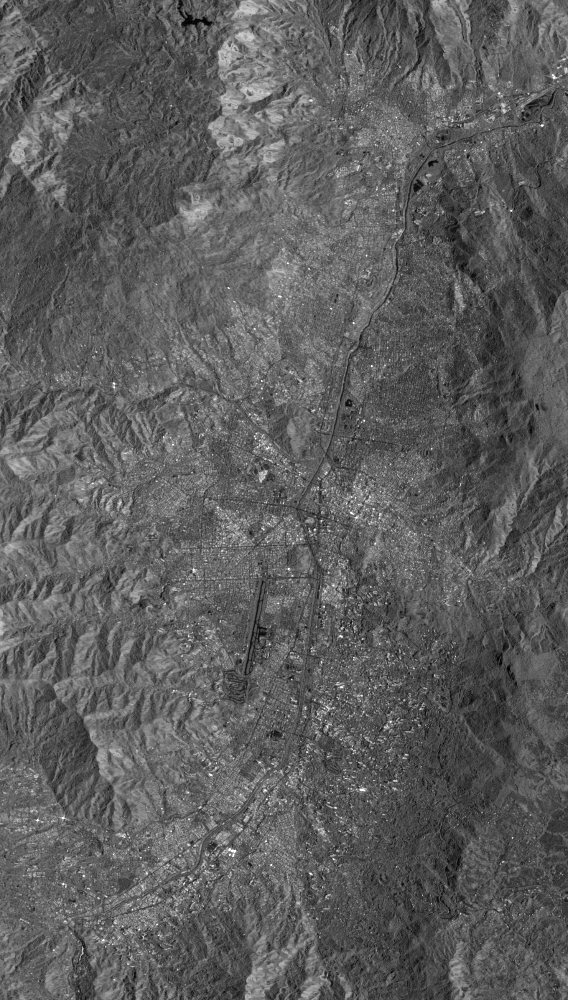

In [6]:
img = cv2.imread(img_path, cv2.IMREAD_UNCHANGED) #Es importante que sea UNCHANGED para no cambiar el formato original de la imagen
h, w = img.shape
print('Cant datos: ', h*w)
cv2_imshow(img)

#Entrenar modelo K-means

In [8]:
X = img.reshape(h*w, 1) #Se aplana la imagen
k = 20 #Se define el número de clases
kmeanModel = KMeans(n_clusters=k, random_state=42).fit(X) #Se define el modelo y de una vez se entrena
print('Centers:', kmeanModel.cluster_centers_) #Se imprimen los centros encontrados
print('Labels: ', kmeanModel.labels_) #Se imprimen las etiquetas asignadas, serán de 0....k
print('Unique labels: ', np.unique(kmeanModel.labels_)) # Se imprimen las etiquetas sin repetir ninguna, se esperan valores de 0...k

Centers: [[ 97.96953979]
 [ 74.09306937]
 [122.38238275]
 [161.95771648]
 [ 26.48692558]
 [ 44.04713154]
 [136.64947416]
 [ 81.03988332]
 [ 61.66076101]
 [109.87643477]
 [ 87.49583655]
 [147.2034685 ]
 [225.9261525 ]
 [116.39827035]
 [ 54.50892582]
 [ 67.61780907]
 [ 92.98216349]
 [128.82685376]
 [183.36404978]
 [103.42813757]]
Labels:  [ 2  2  9 ...  7  7 16]
Unique labels:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]


Recalcular imagen pero en este caso tener en cuenta sólo los 'k' centros encontrados

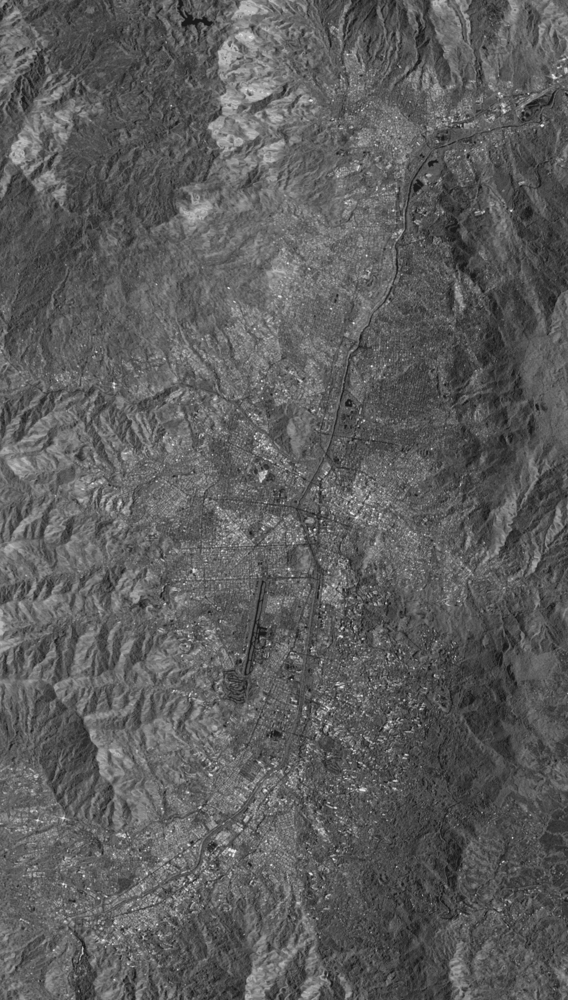

In [9]:
imgk = kmeanModel.cluster_centers_[kmeanModel.labels_].reshape(h, w)
cv2_imshow(imgk)

Dado que el número de clases era grande (k=20) se generó una imagen en la que las diferentes clases son imperceptibles. Ahora se repite el procedimiento con menos clases.

Unique labels:  [0 1 2 3]


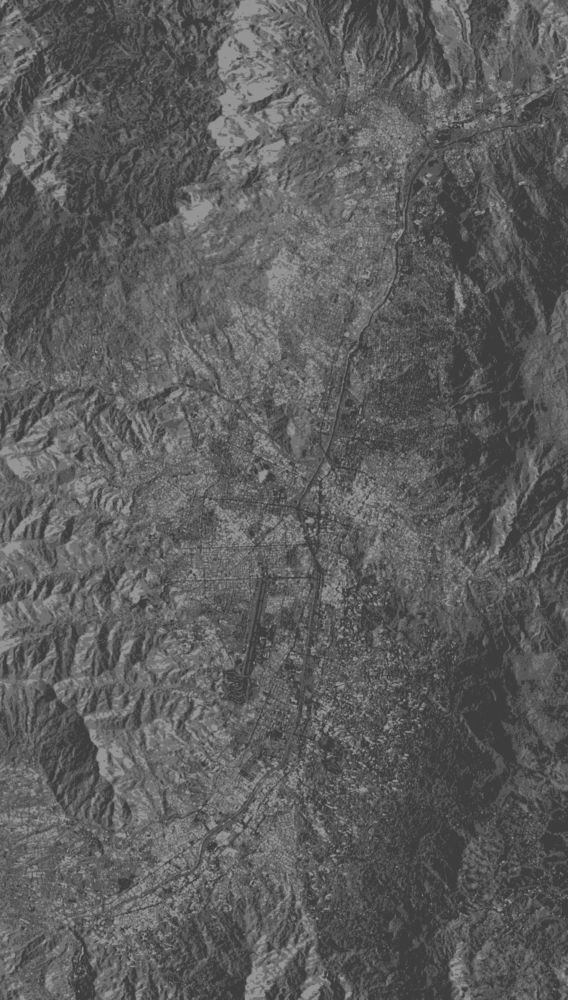

In [11]:
k = 4 #Se define el número de clases
kmeanModel = KMeans(n_clusters=k, random_state=42).fit(X) #Se define el modelo y de una vez se entrena
imgk = kmeanModel.cluster_centers_[kmeanModel.labels_].reshape(h, w)
print('Unique labels: ', np.unique(kmeanModel.labels_)) # Se imprimen las etiquetas sin repetir ninguna, se esperan valores de 0...k
cv2_imshow(imgk)

En este caso se evidencia una imagen mucho más "discreta", es decir,que se forzó a cada pixel de la imagen a pertenecer a una clase entre solo 4 alternativas